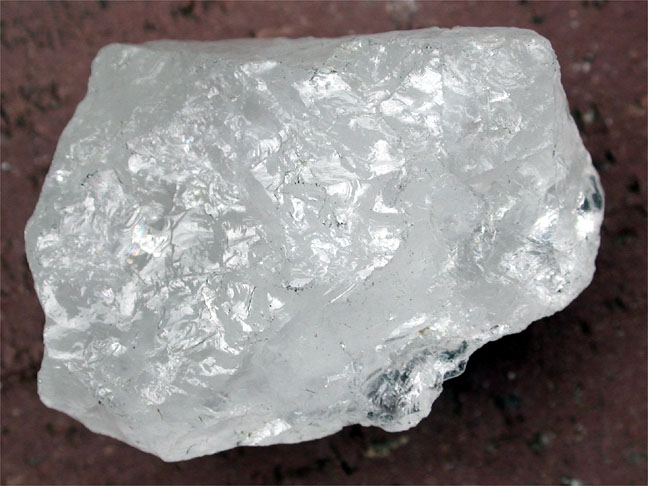

In [2]:
#이미지 확인

from IPython.display import Image

Image("./minet/quartz/0001.jpg")

In [3]:
#데이터 폴더와 종류 입력
folder = './minet'
target_label = ['biotite', 'bornite', 'chrysocolla', 'malachite', 
                'muscovite', 'pyrite', 'quartz']

In [4]:
from torchvision.datasets import ImageFolder
from torchvision import transforms

#데이터세트 지정과 사이즈, 종류 확인
dataset = ImageFolder(folder, transform=transforms.ToTensor())
print('Data size: ',len(dataset))
dataset.classes

Data size:  957


['biotite',
 'bornite',
 'chrysocolla',
 'malachite',
 'muscovite',
 'pyrite',
 'quartz']

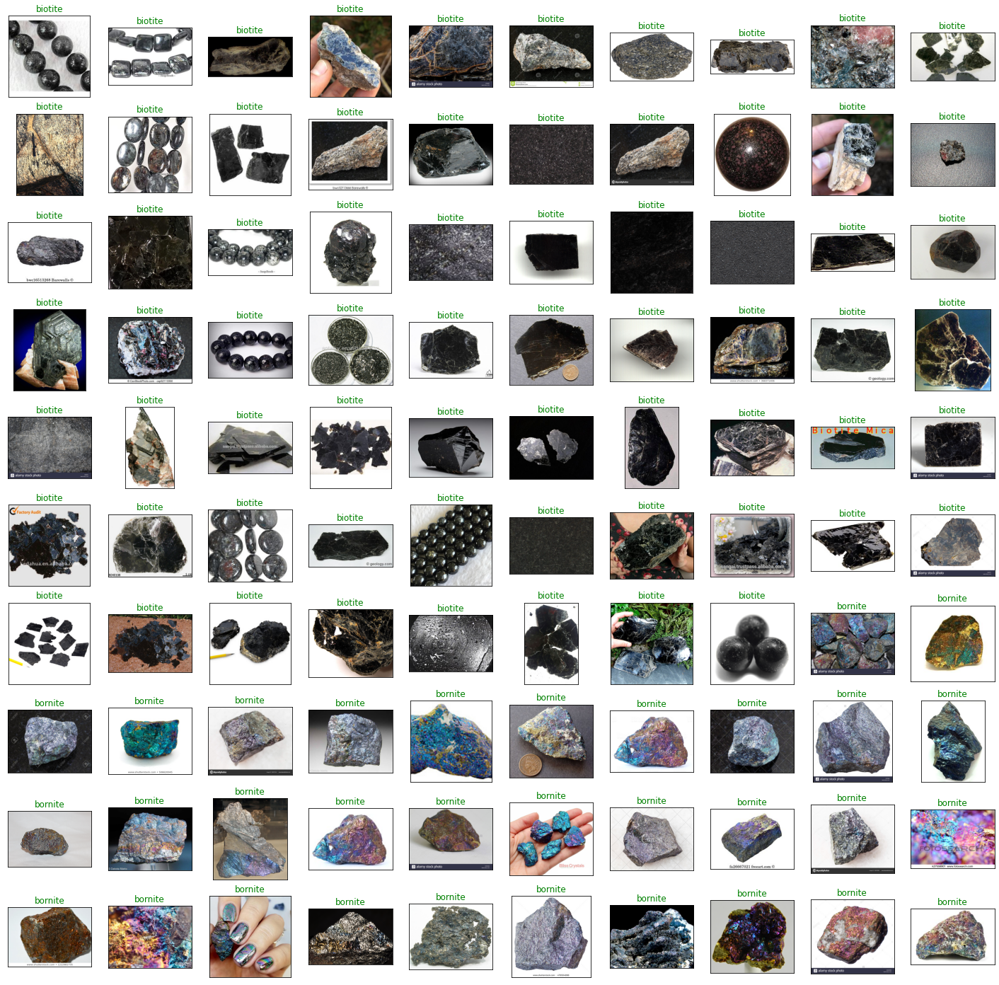

In [5]:
#사진 데이터 확인

import matplotlib.pyplot as plt

fig = plt.figure(figsize=(25, 25))

for i in range(100):
    image, label = dataset[i]
    ax = fig.add_subplot(10, 10, i+1, xticks=[], yticks = [])
    ax.imshow(image.permute(1,2,0))
    ax.set_title(target_label[label], color='green')

In [6]:
#광물 종류와 개수 확인
import pandas as pd
import numpy as np

count = {}

for i in range(len(dataset)):
    _, labels = dataset[i]
    label = target_label[labels]
    if label not in count:
        count[label] = 1
    elif label in count:
        count[label] += 1

df = pd.DataFrame(count, index=np.arange(1))
df = df.transpose().reset_index()
df.columns = ['Mineral', 'count']
df

,Mineral,count
0,biotite,68
1,bornite,170
2,chrysocolla,164
3,malachite,235
4,muscovite,77
5,pyrite,98
6,quartz,145


/opt/homebrew/Caskroom/miniforge/base/envs/tf/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


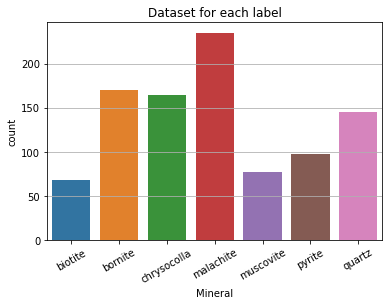

In [7]:
#광물 개수 시각화

import seaborn as sns

sns.barplot(df['Mineral'], df['count'])
plt.title('Dataset for each label');
plt.xticks(rotation=30)
plt.grid(axis='y')

In [8]:
#최소,최대 길이와 높이 확인

height = []
weight = []

for i in range(len(dataset)):
    image, label = dataset[i]
    height.append(image.size(1))
    weight.append(image.size(2))
    
print(f"maximum_height:{np.max(height)} \tminimum_height:{np.min(height)} \tmean_height:{np.mean(height)}")
print(f"maximum_weight:{np.max(weight)} \tminimum_weight:{np.min(weight)} \tmean_weight:{np.mean(weight)}")

maximum_height:6016 	minimum_height:129 	mean_height:696.6415882967607
maximum_weight:6016 	minimum_weight:144 	mean_weight:806.183908045977


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

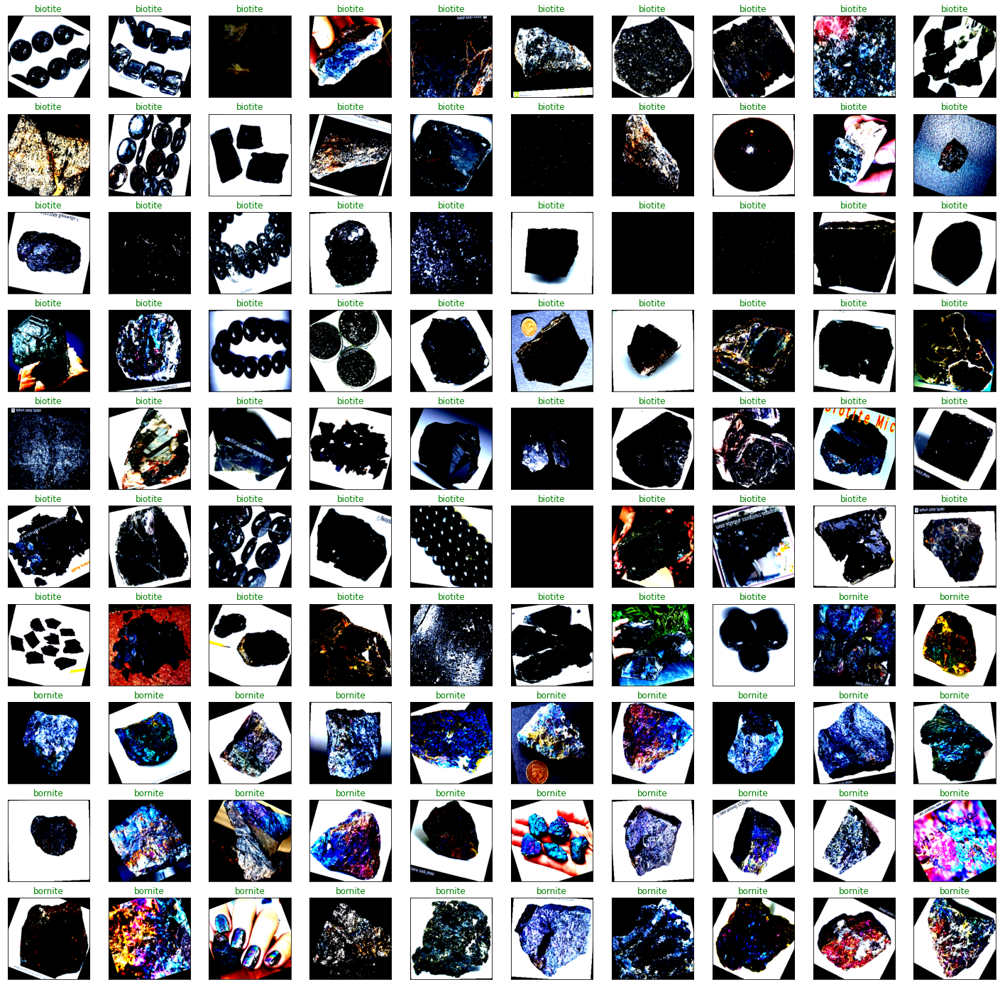

In [9]:
#이미지 정규화 후 데이터 사진확인

data_transform = transforms.Compose([transforms.Resize((224, 224)), 
                                     transforms.RandomRotation(30), 
                                     transforms.RandomVerticalFlip(p=0.5),
                                     transforms.RandomHorizontalFlip(p=0.5),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean = [0.485, 0.456, 0.406],std = [0.229, 0.224, 0.225])])
load_data = ImageFolder(folder, transform=data_transform)

fig = plt.figure(figsize=(25, 25))
for i in range(100):
    image, label = load_data[i]
    ax = fig.add_subplot(10, 10, i+1, xticks=[], yticks = [])
    ax.imshow(image.permute(1,2,0))
    ax.set_title(target_label[label], color='green')

In [10]:
#plot_dist 함수지정(데이터 분포 보는 함수)
from collections import Counter

def plot_dist(indexes, dataset=dataset):
    #dist = {}
    count = Counter()
    for i in indexes:
        _, label = dataset[i]
        count[target_label[label]] += 1
        
    dist_2 = dict(sorted(count.items(), key=lambda kv: kv[1], reverse=True))
    plt.bar(dist_2.keys(), dist_2.values())
    plt.xticks(rotation=30)
    plt.title('Data distribution'); plt.ylabel('count')
    plt.show()

In [11]:
#랜덤으로 train, val값에 데이터를 나누어 넣음
from sklearn.model_selection import train_test_split

idx_label = {}

for i in range(len(dataset)):
    _, label = dataset[i]
    idx_label[i] = label
x_train, x_test, y_train, y_test = train_test_split(list(idx_label.keys()), list(idx_label.values()), 
                                                  stratify = list(idx_label.values()), test_size=0.05)

print(len(x_train))
print(len(x_test))

909
48


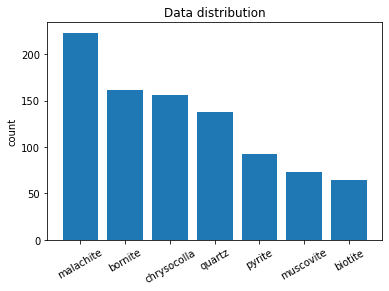

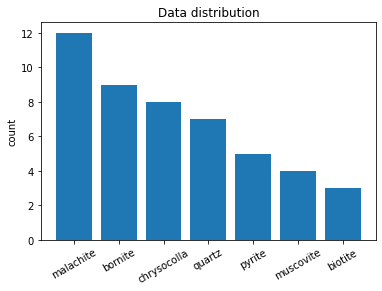

In [12]:
#앞서 만든 함수로 훈련데이터,테스트데이터 개수 시각화
plot_dist(x_train)
plot_dist(x_test)

In [13]:
#훈련세트, 검증세트, 테스트세트
from torch.utils.data import DataLoader, SubsetRandomSampler
    
batch_size = 128

train_set = SubsetRandomSampler(x_train)
test_set = SubsetRandomSampler(x_test)

train_loader = DataLoader(load_data, batch_size=batch_size, 
                          shuffle=False, num_workers=4, sampler= train_set)
test_loader = DataLoader(load_data, batch_size=4,
                         num_workers=4, sampler=test_set)

In [14]:
#토치비전 버전확인(0.10.0이며 다른버전은 지저분한 오류가뜸)
import torchvision

torchvision.__version__

'0.12.0a0'

images.shape: torch.Size([128, 3, 224, 224])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


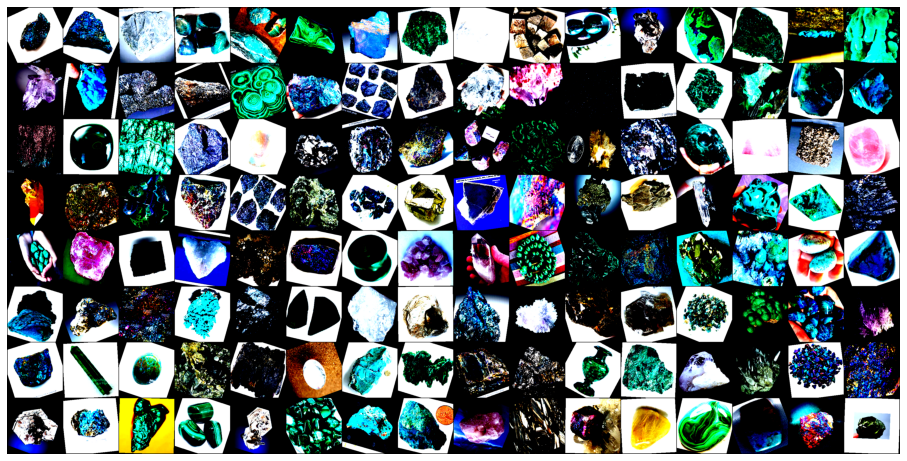

In [15]:
#하나의 배치에 대한 트레인로더 확인
from torchvision.utils import make_grid

for images, _ in train_loader:
    print('images.shape:', images.shape)
    plt.figure(figsize=(16,16))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=16).permute((1, 2, 0)))
    break

In [16]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
import time

#device객체
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [18]:
#모델, 뉴런수 확인(전이학습)
model1 = models.resnet34(pretrained=True)
num_features = model1.fc.in_features
model1.fc = nn.Linear(num_features, 7)
model1 = model1.to(device)

model2 = models.resnet34(pretrained=True)
num_features = model2.fc.in_features
model2.fc = nn.Linear(num_features, 7)
model2 = model2.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_SGD = optim.SGD(model1.parameters(), lr=0.001)
optimizer_adam = optim.Adam(model2.parameters(),lr=0.001)

In [20]:
num_epochs = 1
model2 = torch.load('model_Adam.pt')
model2.train()
start_time = time.time()


# 전체 반복(epoch) 수 만큼 반복하며
for epoch in range(num_epochs):
    running_loss = 0.
    running_corrects = 0

    # 배치 단위로 학습 데이터 불러오기
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 모델에 입력(forward)하고 결과 계산
        optimizer_adam.zero_grad()
        outputs = model2(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # 역전파를 통해 기울기(gradient) 계산 및 학습 진행
        loss.backward()
        optimizer_adam.step()

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_set)
    epoch_acc = running_corrects / len(train_set) * 100.

    torch.save(model2, 'model_Adam.pt')

    # 학습 과정 중에 결과 출력
    print('#{} Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(
        epoch, epoch_loss, epoch_acc, time.time() - start_time))


#0 Loss: 0.2337 Acc: 91.3091% Time: 275.3380s


In [18]:
num_epochs = 5
model1 = torch.load('model_SGD.pt')
model1.train()
start_time = time.time()

# 전체 반복(epoch) 수 만큼 반복하며
for epoch in range(num_epochs):
    running_loss = 0.
    running_corrects = 0

    # 배치 단위로 학습 데이터 불러오기
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 모델에 입력(forward)하고 결과 계산
        optimizer_SGD.zero_grad()
        outputs = model1(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # 역전파를 통해 기울기(gradient) 계산 및 학습 진행
        loss.backward()
        optimizer_SGD.step()

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_set)
    epoch_acc = running_corrects / len(train_set) * 100.

    torch.save(model1, 'model_SGD.pt')

    # 학습 과정 중에 결과 출력
    print('#{} Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(
        epoch, epoch_loss, epoch_acc, time.time() - start_time))


#0 Loss: 1.0841 Acc: 67.8768% Time: 238.9949s
#1 Loss: 1.0858 Acc: 68.8669% Time: 483.6660s
#2 Loss: 1.0865 Acc: 68.0968% Time: 715.0839s
#3 Loss: 1.0787 Acc: 69.6370% Time: 950.3187s
#4 Loss: 1.0886 Acc: 67.8768% Time: 1184.4702s


In [31]:
model3 = models.resnet34(pretrained=True)
num_features = model3.fc.in_features
model3.fc = nn.Linear(num_features, 7)
model3 = model3.to(device)

optimizer_Momentum = optim.SGD(model3.parameters(), lr=0.001, momentum=0.9)

In [32]:
num_epochs = 20
model3.train()
start_time = time.time()


# 전체 반복(epoch) 수 만큼 반복하며
for epoch in range(num_epochs):
    running_loss = 0.
    running_corrects = 0

    # 배치 단위로 학습 데이터 불러오기
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # 모델에 입력(forward)하고 결과 계산
        optimizer_Momentum.zero_grad()
        outputs = model3(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # 역전파를 통해 기울기(gradient) 계산 및 학습 진행
        loss.backward()
        optimizer_Momentum.step()

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_set)
    epoch_acc = running_corrects / len(train_set) * 100.

    torch.save(model3, 'model_Momentum.pt')

    # 학습 과정 중에 결과 출력
    print('#{} Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(
        epoch, epoch_loss, epoch_acc, time.time() - start_time))


#0 Loss: 2.1277 Acc: 17.6018% Time: 286.3576s
#1 Loss: 1.7138 Acc: 33.2233% Time: 569.7147s
#2 Loss: 1.3260 Acc: 57.6458% Time: 851.0964s
#3 Loss: 1.0333 Acc: 68.0968% Time: 2348.6133s
#4 Loss: 0.8288 Acc: 77.6678% Time: 4337.4364s
#5 Loss: 0.6691 Acc: 82.8383% Time: 4620.1283s
#6 Loss: 0.5409 Acc: 86.5787% Time: 4902.3229s
#7 Loss: 0.4481 Acc: 88.8889% Time: 5174.8773s
#8 Loss: 0.3902 Acc: 89.8790% Time: 5448.9624s
#9 Loss: 0.3335 Acc: 92.4092% Time: 5711.8812s
#10 Loss: 0.3009 Acc: 90.7591% Time: 5990.3156s
#11 Loss: 0.2742 Acc: 92.7393% Time: 6267.2974s
#12 Loss: 0.2473 Acc: 94.3894% Time: 6539.0354s
#13 Loss: 0.2381 Acc: 93.6194% Time: 6810.9753s
#14 Loss: 0.2070 Acc: 94.6095% Time: 7082.4410s
#15 Loss: 0.1850 Acc: 95.2695% Time: 7371.3574s
#16 Loss: 0.1727 Acc: 95.9296% Time: 7649.4561s
#17 Loss: 0.1587 Acc: 96.4796% Time: 7927.0653s
#18 Loss: 0.1479 Acc: 96.2596% Time: 8203.6975s
#19 Loss: 0.1256 Acc: 97.3597% Time: 8475.3367s


In [19]:
def showtime(input):
    # torch.Tensor를 numpy 객체로 변환
    input = input.numpy().transpose((1, 2, 0))
    # 이미지 정규화 해제하기
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # 이미지 출력
    plt.imshow(input)
    plt.show()

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


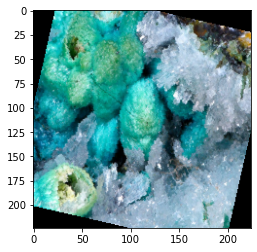

[예측 결과: malachite] (실제 정답: malachite)


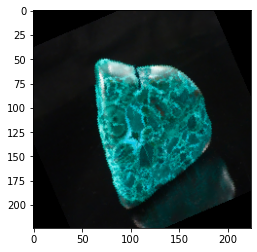

[예측 결과: malachite] (실제 정답: malachite)


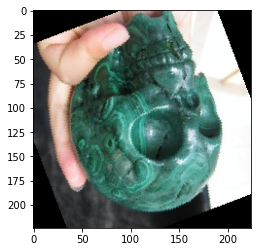

[예측 결과: pyrite] (실제 정답: pyrite)


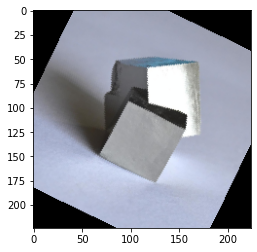

[예측 결과: malachite] (실제 정답: malachite)


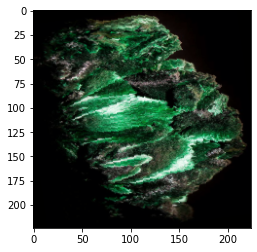

[예측 결과: malachite] (실제 정답: malachite)


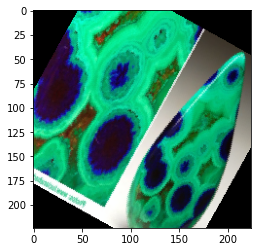

[예측 결과: muscovite] (실제 정답: quartz)


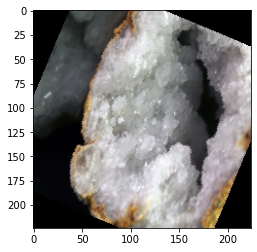

[예측 결과: biotite] (실제 정답: bornite)


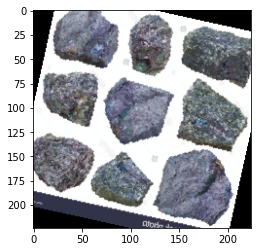

[예측 결과: malachite] (실제 정답: malachite)


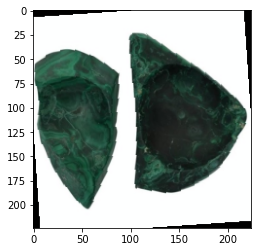

[예측 결과: biotite] (실제 정답: biotite)


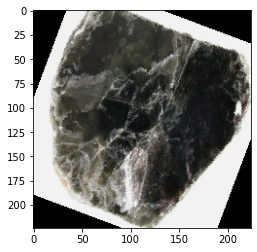

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


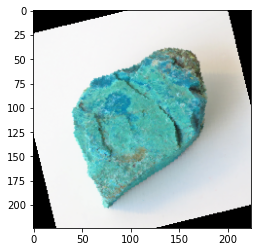

[예측 결과: quartz] (실제 정답: quartz)


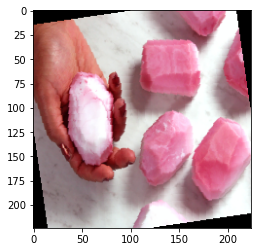

[Test Phase] Loss: 0.7743 Acc: 77.0833% Time: 25.6236s


In [23]:
from PIL import Image


model = torch.load('model_Adam.pt')
model.eval()
start_time = time.time()

with torch.no_grad():
    running_loss = 0.
    running_corrects = 0

    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        # 한 배치의 첫 번째 이미지에 대하여 결과 시각화
        print(f'[예측 결과: {target_label[preds[0]]}] (실제 정답: {target_label[labels.data[0]]})')
        showtime(inputs.cpu().data[0])

    epoch_loss = running_loss / len(test_set)
    epoch_acc = running_corrects / len(test_set) * 100.
    print('[Test Phase] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch_loss, epoch_acc, time.time() - start_time))

[예측 결과: bornite] (실제 정답: bornite)


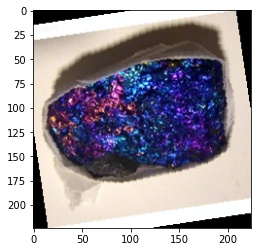

[예측 결과: quartz] (실제 정답: quartz)


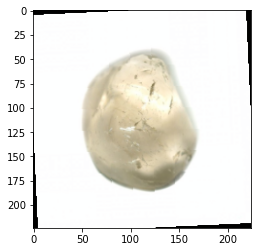

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


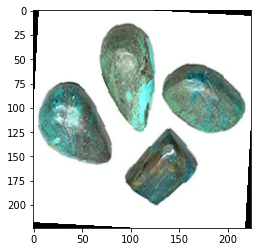

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


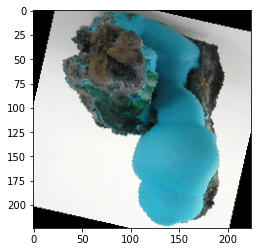

[예측 결과: malachite] (실제 정답: malachite)


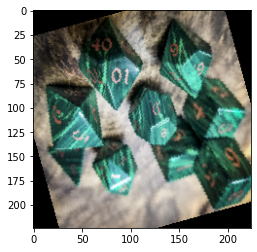

[예측 결과: malachite] (실제 정답: chrysocolla)


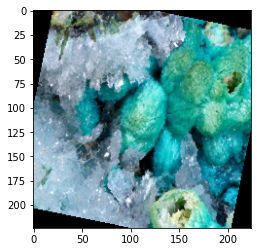

[예측 결과: pyrite] (실제 정답: pyrite)


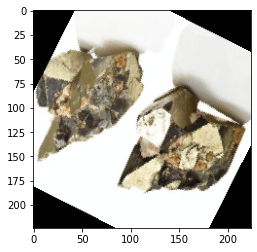

[예측 결과: quartz] (실제 정답: quartz)


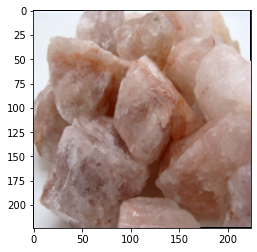

[예측 결과: bornite] (실제 정답: bornite)


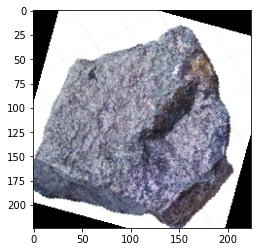

[예측 결과: muscovite] (실제 정답: biotite)


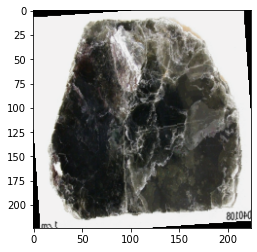

[예측 결과: quartz] (실제 정답: quartz)


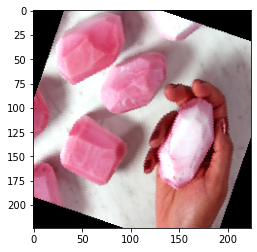

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


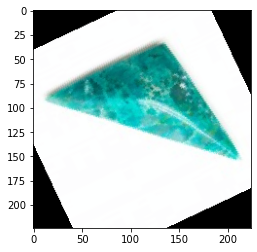

[Test Phase] Loss: 1.1707 Acc: 70.8333% Time: 24.6469s


In [24]:
model = torch.load('model_SGD.pt')
model.eval()
start_time = time.time()

with torch.no_grad():
    running_loss = 0.
    running_corrects = 0

    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        # 한 배치의 첫 번째 이미지에 대하여 결과 시각화
        print(f'[예측 결과: {target_label[preds[0]]}] (실제 정답: {target_label[labels.data[0]]})')
        showtime(inputs.cpu().data[0])

    epoch_loss = running_loss / len(test_set)
    epoch_acc = running_corrects / len(test_set) * 100.
    print('[Test Phase] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch_loss, epoch_acc, time.time() - start_time))

[예측 결과: malachite] (실제 정답: malachite)


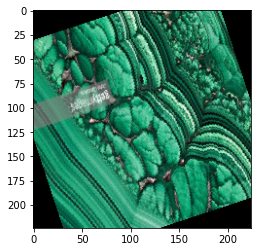

[예측 결과: bornite] (실제 정답: bornite)


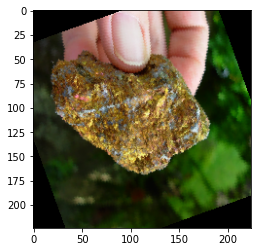

[예측 결과: muscovite] (실제 정답: muscovite)


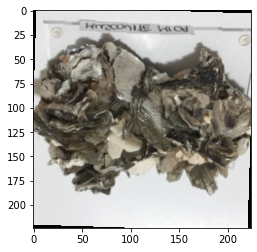

[예측 결과: pyrite] (실제 정답: pyrite)


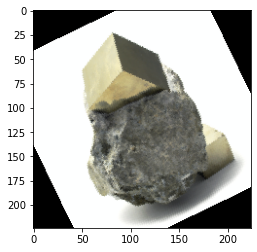

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


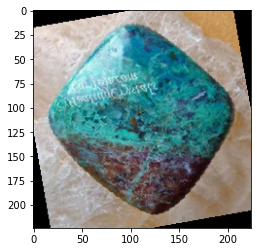

[예측 결과: bornite] (실제 정답: bornite)


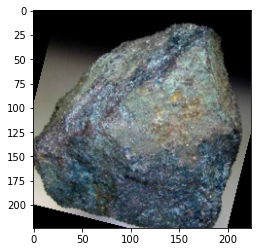

[예측 결과: bornite] (실제 정답: bornite)


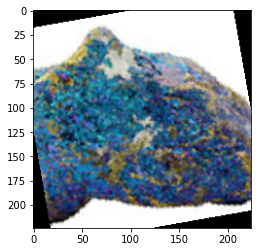

[예측 결과: malachite] (실제 정답: malachite)


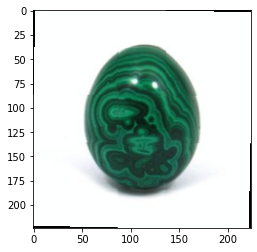

[예측 결과: chrysocolla] (실제 정답: chrysocolla)


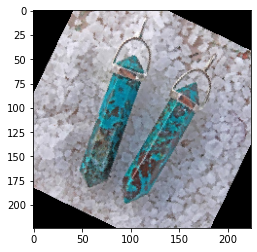

[예측 결과: biotite] (실제 정답: biotite)


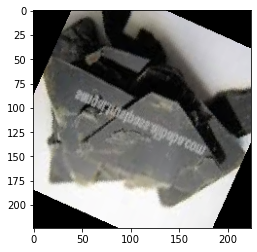

[예측 결과: quartz] (실제 정답: quartz)


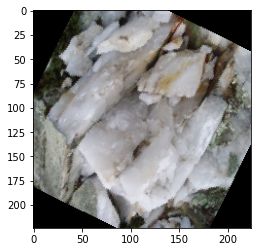

[예측 결과: muscovite] (실제 정답: muscovite)


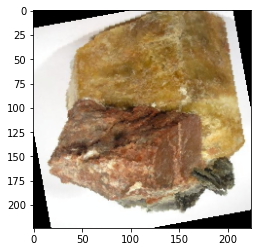

[Test Phase] Loss: 0.2284 Acc: 91.6667% Time: 24.8691s


In [20]:
model = torch.load('model_Momentum.pt')
model.eval()
start_time = time.time()

with torch.no_grad():
    running_loss = 0.
    running_corrects = 0

    for inputs, labels in test_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        # 한 배치의 첫 번째 이미지에 대하여 결과 시각화
        print(f'[예측 결과: {target_label[preds[0]]}] (실제 정답: {target_label[labels.data[0]]})')
        showtime(inputs.cpu().data[0])

    epoch_loss = running_loss / len(test_set)
    epoch_acc = running_corrects / len(test_set) * 100.
    print('[Test Phase] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch_loss, epoch_acc, time.time() - start_time))